In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import math as m

import dask
import dask.dataframe as dd
import dask.array as da
import dask.bag as db

import hvplot.dask
import hvplot.pandas
import timeit

%matplotlib inline

pd.set_option('display.max_columns', None)
#sn.set_palette("pastel")

## Dask

Using dask to concatenate the outputs_* files into a single dataframe, and then proced with the systems selection.

In [2]:
# create dask dataframe

outputs = dd.read_csv('./data/sevn_output_Z0.01A1L1/data_0/output_*.csv')

In [18]:
outputs.head(10)

,ID,name,Mass_0,MHE_0,MCO_0,Radius_0,RHE_0,RCO_0,Luminosity_0,Temperature_0,Lambda_0,Phase_0,PhaseBSE_0,RemnantType_0,Zams_0,Mass_1,MHE_1,MCO_1,Radius_1,RHE_1,RCO_1,Luminosity_1,Temperature_1,Lambda_1,Phase_1,PhaseBSE_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,GWtime,BWorldtime,BEvent
0,0,0_727853901419926,6.639921,0.000000e+00,0.000000e+00,2.788694,0.000000e+00,0.000000e+00,1553.550000,21699.890,NaN,1,1.0,0,6.640000,3.048960,0.000000e+00,0.0,1.793015,0.000000e+00,0.0,99.04002,13598.380,NaN,1,1.0,0,3.049,26500.00,0.007180,3.775692e+17,0.00000,-1
1,0,0_727853901419926,6.633968,1.799810e-07,0.000000e+00,6.862340,6.699702e-08,0.000000e+00,4332.031000,17875.710,0.585937,2,1.0,0,6.640000,3.048702,0.000000e+00,0.0,1.957768,0.000000e+00,0.0,107.26150,13275.680,NaN,1,1.0,0,3.049,26517.00,0.007180,3.791535e+17,47.43242,0
2,0,0_727853901419926,6.633956,9.473092e-01,0.000000e+00,6.670554,2.777507e-01,0.000000e+00,4464.203000,18267.600,0.592618,3,2.0,0,6.640000,3.048702,0.000000e+00,0.0,1.957893,0.000000e+00,0.0,107.26770,13275.450,NaN,1,1.0,0,3.049,26517.03,0.007180,3.791567e+17,47.46672,0
3,0,0_727853901419926,6.631996,1.220142e+00,0.000000e+00,193.055900,1.442467e-01,0.000000e+00,8194.526000,3952.447,1.789408,4,4.0,0,6.640000,3.048701,0.000000e+00,0.0,1.958812,0.000000e+00,0.0,107.31340,13273.750,NaN,1,1.0,0,3.049,26522.40,0.007180,3.796530e+17,47.72008,0
4,0,0_727853901419926,6.598207,1.783184e+00,7.021154e-08,133.773200,1.632959e-01,5.961738e-09,5011.689000,4198.925,1.353005,5,4.0,0,6.640000,3.048680,0.000000e+00,0.0,1.974133,0.000000e+00,0.0,108.07460,13245.530,NaN,1,1.0,0,3.049,26615.28,0.007180,3.883298e+17,51.92399,0
5,0,0_727853901419926,6.598082,1.783979e+00,6.768928e-01,140.054900,1.635999e-01,5.414135e-02,5309.719000,4163.372,1.425329,6,5.0,0,6.640000,3.048680,0.000000e+00,0.0,1.974184,0.000000e+00,0.0,108.07710,13245.430,NaN,1,1.0,0,3.049,26615.63,0.007180,3.883623e+17,51.93795,0
6,0,0_727853901419926,1.035694,0.000000e+00,0.000000e+00,0.007654,0.000000e+00,0.000000e+00,654.553300,333710.300,NaN,7,10.0,1,1.384336,3.055890,0.000000e+00,0.0,1.975638,0.000000e+00,0.0,108.14930,13242.770,NaN,1,1.0,0,3.049,61108.06,0.007162,1.617095e+20,52.33502,0
7,0,0_727853901419926,1.035694,0.000000e+00,0.000000e+00,0.007654,0.000000e+00,0.000000e+00,0.011760,21726.360,NaN,7,10.0,1,1.384336,3.053072,9.644846e-09,0.0,4.456184,5.435513e-09,0.0,244.07940,10807.560,0.583617,2,1.0,0,3.049,61150.18,0.007162,1.624173e+20,297.51640,0
8,0,0_727853901419926,1.035694,0.000000e+00,0.000000e+00,0.007654,0.000000e+00,0.000000e+00,0.011746,21719.700,NaN,7,10.0,1,1.384336,3.053065,3.001532e-01,0.0,4.378908,1.335460e-01,0.0,241.97700,10878.960,0.587715,3,2.0,0,3.049,61150.27,0.007162,1.624188e+20,297.73140,0
9,0,0_727853901419926,1.035694,0.000000e+00,0.000000e+00,0.007654,0.000000e+00,0.000000e+00,0.011515,21612.040,NaN,7,10.0,1,1.384336,3.052141,4.705221e-01,0.0,42.518350,6.639426e-02,0.0,609.99040,4399.154,1.408071,4,4.0,0,3.049,61164.11,0.007162,1.626519e+20,301.24170,0


In [4]:
# select bh+MS star systems

mask = (((outputs['RemnantType_0'] == 6) & (outputs['RemnantType_1'] == 0) & (outputs['Phase_1'] == 1)) | ((outputs['RemnantType_1'] == 6) & (outputs['RemnantType_0'] == 0) & (outputs['Phase_0'] == 1)))
bh_star_df = outputs[mask]

In [5]:
# selecting only binary systems

bh_star_df = bh_star_df[bh_star_df['Semimajor'].notnull()]

# dividing non-interacting and interacting sys
# by roche lobe radius

q_0 = bh_star_df['Mass_0']/bh_star_df['Mass_1']

rl_0 = (0.49*q_0**(2/3)*bh_star_df['Semimajor'])/(0.6*q_0**(2/3)+np.log(1+q_0**(1/3)))

q_1 = bh_star_df['Mass_1']/bh_star_df['Mass_0']

rl_1 = (0.49*q_1**(2/3)*bh_star_df['Semimajor'])/(0.6*q_1**(2/3)+np.log(1+q_1**(1/3)))

mask_1 = ((bh_star_df['Radius_0']>rl_0) | (bh_star_df['Radius_1']>rl_1))
mask_2 = ((bh_star_df['Radius_0']<=rl_0) | (bh_star_df['Radius_1']<= rl_1))

# creating new dataframes for interating and non interacting systems

int_binsys = bh_star_df[mask_1]

non_int_binsys = bh_star_df[mask_2]


In [6]:
# adding column Period to int_binsys and non_int_binsys

from astropy import constants as const
from astropy import units as u

semimaj = int_binsys['Semimajor']* const.R_sun
mass_tot = (int_binsys['Mass_0'] * const.M_sun) + (int_binsys['Mass_1'] * const.M_sun)

s_to_day = 60*60*24

period = (2*m.pi*np.sqrt( semimaj**3 / (const.G * mass_tot) )) / s_to_day

int_binsys['Period'] = period

int_binsys['logP'] = np.log10(period)

semimaj_n = non_int_binsys['Semimajor']* const.R_sun
mass_tot_n = (non_int_binsys['Mass_0'] * const.M_sun) + (non_int_binsys['Mass_1'] * const.M_sun)

s_to_day_n = 60*60*24

period_n = (2*m.pi*np.sqrt( semimaj_n**3 / (const.G * mass_tot_n) )) / s_to_day_n

non_int_binsys['Period'] = period_n

non_int_binsys['logP'] = np.log10(period_n)

In [276]:
# save the new dataframes 

non_int_binsys.compute().to_csv('./data/sevn_output_Z0.0001A1L1/non_int_binsys.csv')
int_binsys.compute().to_csv('./data/sevn_output_Z0.0001A1L1/int_binsys.csv')

In [277]:
# save the dataframes in parquet format 

int_binsys.compute().to_parquet('./data/sevn_output_Z0.0001A1L1/int_binsys.parquet')
non_int_binsys.compute().to_parquet('./data/sevn_output_Z0.0001A1L1/non_int_binsys.parquet')

## Real data database

In [1]:
data_real = {'ID': ['R00', 'R01', 'R02', 'R03'],
        'name': ['BH1', 'VFTS 243', 'HD130298', 'BH2*'],
        'Mass_BH': [9.6, 10.1, 7.7, 8.9],
        'dMass_BH': [0.18, 2, 1.5, 0.3],
        'Mass_1': [0.93, 25.0, 24.2, 1.07],
        'dMass_1': [0.05, 2.3, 3.8, 0.19],
        'Period': [185.59, 10.4031, 14.62959, 1300],
        'dPeriod': [0.05, 0.0004, 0.00085, 26],
        'logP': np.log10([185.59, 10.4031, 14.62959, 1300]),
        'dlogP': np.log10([0.05, 0.0004, 0.00085, 26]),
        'Eccentricity': [0.45, 0.017, 0.457, 0.515],
        'dEccentricity': [0.005, 0.012, 0.007, 0.01],
        'loc': ['MW', 'LMC', 'MW', 'MW'],
        'system': ['disc-field', 'OC', 'runway-field', 'field'],
        'Z': ['solar', 'sub-solar', 'solar', 'solar']  
    
}

real_data = pd.DataFrame(data_real)

In [3]:
real_data.to_parquet('./real_data.parquet')
real_data.to_csv('./real_data.csv')

### CSV (Dask) vs Parquet 
Running some tests with heavy plots (bokeh) with the biggest file (non_int_binsys &rarr; 300k+ rows) it appears that it's faster to work with the parquet file. Still to understand if it better to work with partitions or just a single file (for future increasing of the dataset)

In [2]:
# load the parquet files

file_int = pd.read_parquet('./data/sevn_output_Z0.0001A1L1/int_binsys.parquet')
file_nint = pd.read_parquet('./data/sevn_output_Z0.0001A1L1/non_int_binsys.parquet')
real_data = pd.read_parquet('./data/real_data.parquet')
type_df = pd.read_csv('./data/sevn_output_Z0.0001A1L1/type/type_df.csv')

file_nint.head(1)
#file_nint.head(1)

,ID,name,Mass_0,MHE_0,MCO_0,Radius_0,RHE_0,RCO_0,Luminosity_0,Temperature_0,Lambda_0,Phase_0,PhaseBSE_0,RemnantType_0,Zams_0,Mass_1,MHE_1,MCO_1,Radius_1,RHE_1,RCO_1,Luminosity_1,Temperature_1,Lambda_1,Phase_1,PhaseBSE_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,GWtime,BWorldtime,BEvent,Period,logP
108,8,0_161360954723734,22.75556,0.0,0.0,0.000097,0.0,0.0,1.000000e-10,1857.136,NaN,7,14.0,6,23.278,14.31763,0.0,0.0,4.257485,0.0,0.0,28864.44,36462.02,NaN,1,1.0,0,14.319,22799.77,0.066223,3.307082e+15,7.720565,0,65495.133897,4.816209


In [7]:
# restrict data to T, P, M, e, a, L

restr_data_int = file_int[['ID', 'name', 'Radius_0', 'Mass_0', 'Temperature_0', 'Luminosity_0', 'Radius_1', 'Mass_1', 'Temperature_1', 'Luminosity_1', 'Eccentricity', 'Period', 'logP', 'Semimajor', 'BWorldtime']]
restr_data_nint = file_nint[['ID', 'name', 'Radius_0', 'Mass_0', 'Temperature_0', 'Luminosity_0', 'Radius_1', 'Mass_1', 'Temperature_1', 'Luminosity_1', 'Eccentricity', 'Period', 'logP', 'Semimajor', 'BWorldtime']]

restr_data_nint.head()

,ID,name,Radius_0,Mass_0,Temperature_0,Luminosity_0,Radius_1,Mass_1,Temperature_1,Luminosity_1,Eccentricity,Period,logP,Semimajor,BWorldtime
108,8,0_161360954723734,0.000097,22.75556,1857.136,1.000000e-10,4.257485,14.31763,36462.02,28864.44,0.066223,65495.133897,4.816209,22799.7700,7.720565
188,15,0_788916259432216,0.000122,28.78476,1651.225,1.000000e-10,4.168704,15.42854,37910.40,32339.22,0.408446,35649.561140,4.552054,16118.5100,5.829052
249,20,0_811800507938564,0.000159,37.40535,1448.507,1.000000e-10,37.722770,69.06862,31852.30,1319666.00,0.388137,3506.966661,3.544932,4604.0500,3.282182
689,52,0_209066710874162,0.000220,51.78257,1231.107,1.000000e-10,5.955198,24.55967,43665.87,116159.50,0.006549,100.440560,2.001909,385.7437,4.119592
690,52,0_209066710874162,0.000220,51.78257,1231.107,1.000000e-10,5.955198,24.55967,43665.87,116159.50,0.006549,100.440560,2.001909,385.7437,4.119592


In [93]:
#print(len(file_int['Radius_0']))
#print((restr_data_int['Mass_0']> restr_data_int['Mass_1']).sum())

print('In int_binsys the primary objs are all BHs, becase all Radius_0 ~ 0')
print('In non_int_binsys the primary objs are all BHs, becase all Radius_0 ~ 0')

## so we can rename *_0 as *_BH

restr_data_int = restr_data_int.rename(columns={'Radius_0': 'Radius_BH', 'Mass_0': 'Mass_BH', 'Temperature_0': 'Temperature_BH', 'Luminosity_0': 'Luminosity_BH'})
restr_data_nint = restr_data_nint.rename(columns={'Radius_0': 'Radius_BH', 'Mass_0': 'Mass_BH', 'Temperature_0': 'Temperature_BH', 'Luminosity_0': 'Luminosity_BH'})

In int_binsys the primary objs are all BHs, becase all Radius_0 ~ 0
In non_int_binsys the primary objs are all BHs, becase all Radius_0 ~ 0


In [85]:
#print(len(restr_data_int['ID']))
#print(restr_data_int.duplicated('ID', keep='true').sum())

In [8]:
# removing duolicated line for the same id, jff

dupl_int = restr_data_int.drop_duplicates(subset=['ID'], keep='first')
dupl_nint = restr_data_nint.drop_duplicates(subset=['ID'], keep='first')

print(len(restr_data_int), len(dupl_int))
print(len(restr_data_nint), len(dupl_nint))

'''
plt.scatter(dupl_int['Temperature_1'], np.log10(dupl_int["Luminosity_1"]), alpha=0.8, color='orange') 
#plt.scatter(restr_data['Temperature_1'], restr_data["Luminosity_1"], color='navy', alpha=0.1)

# removed rows
prova = restr_data_int[restr_data_int.duplicated('ID', keep='first')]
print(len(prova))
plt.scatter(prova['Temperature_1'], np.log10(prova['Luminosity_1']), marker='x', color='cyan')

'''

3850 3846
78308 54547


'\nplt.scatter(dupl_int[\'Temperature_1\'], np.log10(dupl_int["Luminosity_1"]), alpha=0.8, color=\'orange\') \n#plt.scatter(restr_data[\'Temperature_1\'], restr_data["Luminosity_1"], color=\'navy\', alpha=0.1)\n\n# removed rows\nprova = restr_data_int[restr_data_int.duplicated(\'ID\', keep=\'first\')]\nprint(len(prova))\nplt.scatter(prova[\'Temperature_1\'], np.log10(prova[\'Luminosity_1\']), marker=\'x\', color=\'cyan\')\n\n'

In [9]:
restr_data_nint = restr_data_nint.merge(type_df, on=['name'], how='left')

print(np.shape(file_nint))
print(restr_data_nint['type'].value_counts())

(78308, 35)
MT    49673
NI    26447
CE     2188
Name: type, dtype: int64


In [10]:
dupl_nint = restr_data_nint.drop_duplicates(subset=['ID'], keep='first')

print(len(restr_data_nint), len(dupl_nint))

78308 54547


In [ ]:
# create plots
fig, axes = plt.subplots(3, 3, figsize=(30,18))

fig.suptitle('Non-Interacting systems', fontsize=24)

sn.scatterplot(ax=axes[0,0], data=restr_data_nint, x='Mass_BH', y='Period')
sn.scatterplot(ax=axes[0,1], data=restr_data_nint, x='Mass_BH', y='Mass_1')
sn.scatterplot(ax=axes[0,2], data=restr_data_nint, x='Mass_BH', y='Eccentricity')

axes[0,0].set_xlabel('Mass_BH [M_sun]')
axes[0,0].set_ylabel('Period [day]')
axes[0,1].set_xlabel('Mass_BH [M_sun]')
axes[0,1].set_ylabel('Temperature_1 [K]')
axes[0,2].set_xlabel('Mass_BH [M_sun]')
axes[0,2].set_ylabel('Mass_1 [M_sun]')

sn.scatterplot(ax=axes[1,0], data=restr_data_int, x='Mass_1', y='Eccentricity')
sn.scatterplot(ax=axes[1,1], data=restr_data_int, x='Mass_BH', y='Eccentricity')
sn.scatterplot(ax=axes[1,2], data=restr_data_int, x='Mass_1', y='Period')

axes[1,0].set_xlabel('Mass_1 [M_sun]')

axes[1,1].set_xlabel('Mass_BH [M_sun]')

axes[1,2].set_xlabel('Mass_1 [M_sun]')
axes[1,2].set_ylabel('Period [day]')

sn.scatterplot(ax=axes[2,0], data=restr_data_int, x='Mass_1', y='Temperature_1')
sn.scatterplot(ax=axes[2,1], data=restr_data_int, x='Period', y='Eccentricity')
sn.scatterplot(ax=axes[2,2], data=restr_data_int, x='Temperature_1', y='Period')

axes[2,0].set_xlabel('Mass_1 [M_sun]')
axes[2,0].set_ylabel('Temperature_1 [K]')
axes[2,1].set_xlabel('Period [day]')

axes[2,2].set_xlabel('Temperature_1 [K]')
axes[2,2].set_ylabel('Period [day]')

In [ ]:
g = sn.jointplot(data=restr_data_nint, x='Mass_BH', y='Period')
plt.yscale('log')
#g.plot_joint(sn.kdeplot, color="b", levels=6)
g.set_axis_labels('Mass_BH [M_sun]', 'Period [day]')

In [ ]:
#s = sn.jointplot(x='Mass_BH', y='logP', data=restr_data_nint, kind='hex', color='mediumseagreen');
#s.set_yscale("log")
#s.fig.suptitle("Sales by firm's age", y=1.02);


cols = ['Period', 'Eccentricity', 'Mass_BH', 'Mass_1']

fig, ax = plt.subplots(2,3, figsize=(30,18))

for i, col1 in enumerate(cols):
    for j, col2 in enumerate(cols):
        if i != j:
            ax[i,j].hist2d(data=restr_data_nint, x=col1, y=col2)

In [11]:
restr_data_nint

,ID,name,Radius_0,Mass_0,Temperature_0,Luminosity_0,Radius_1,Mass_1,Temperature_1,Luminosity_1,Eccentricity,Period,logP,Semimajor,BWorldtime,Unnamed: 0,BEvent,type
0,8,0_161360954723734,0.000097,22.755560,1857.136,1.000000e-10,4.257485,14.31763,36462.02,28864.44,0.066223,65495.133897,4.816209,22799.77000,7.720565,48,-1,NI
1,15,0_788916259432216,0.000122,28.784760,1651.225,1.000000e-10,4.168704,15.42854,37910.40,32339.22,0.408446,35649.561140,4.552054,16118.51000,5.829052,88,-1,NI
2,20,0_811800507938564,0.000159,37.405350,1448.507,1.000000e-10,37.722770,69.06862,31852.30,1319666.00,0.388137,3506.966661,3.544932,4604.05000,3.282182,119,-1,NI
3,52,0_209066710874162,0.000220,51.782570,1231.107,1.000000e-10,5.955198,24.55967,43665.87,116159.50,0.006549,100.440560,2.001909,385.74370,4.119592,361,-1,MT
4,52,0_209066710874162,0.000220,51.782570,1231.107,1.000000e-10,5.955198,24.55967,43665.87,116159.50,0.006549,100.440560,2.001909,385.74370,4.119592,361,-1,MT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78303,933318,0_662290368027224,0.000025,5.845419,3664.204,1.000000e-10,4.850811,16.12444,37552.94,42159.76,0.897443,170.691767,2.232213,362.67860,7.269409,120408,-1,MT
78304,933318,0_662290368027224,0.000025,5.845419,3664.204,1.000000e-10,4.850811,16.12444,37552.94,42159.76,0.897443,170.691767,2.232213,362.67860,7.269409,120408,-1,MT
78305,933327,0_865991918734628,0.000095,22.321550,1875.104,1.000000e-10,7.049566,20.12238,37902.82,92406.93,0.011780,12.821400,1.107935,80.41430,7.341001,120474,-1,MT
78306,933327,0_865991918734628,0.000095,22.321550,1875.104,1.000000e-10,7.049566,20.12238,37902.82,92406.93,0.011780,12.821400,1.107935,80.41430,7.341001,120474,-1,MT


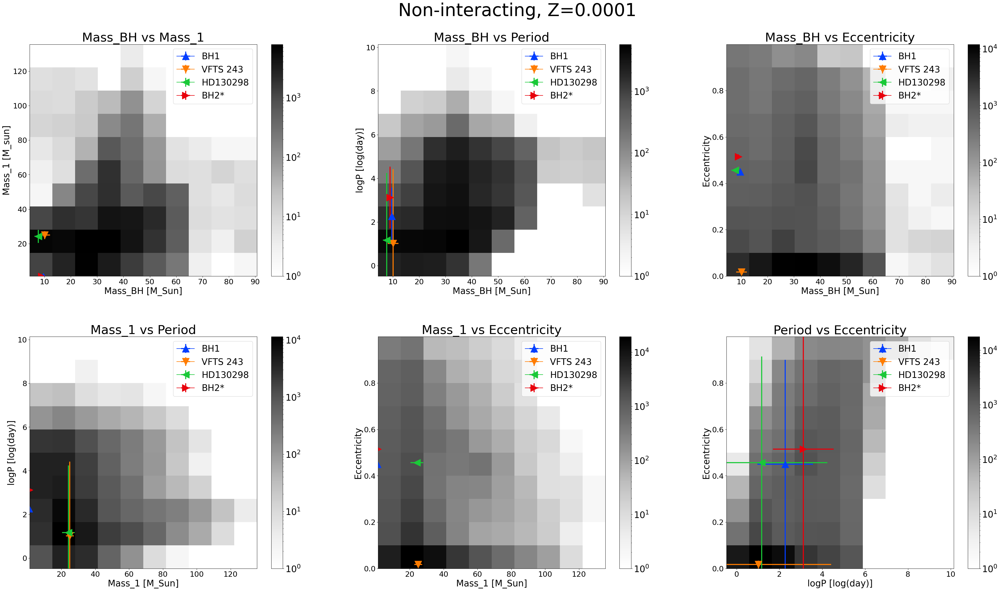

In [97]:
import matplotlib
from scipy.spatial import ConvexHull
import itertools

sn.set_palette('bright')
fig, ax = plt.subplots(2,3, figsize=(43,25))
fig.tight_layout(pad=15.0)

fig.suptitle('Non-interacting, Z=0.0001', fontsize=50)

for i in range(2):
    for j in range(3):
        ax[i,j].tick_params(labelsize=21)
        ax[i,j].xaxis.label.set_size(25)
        ax[i,j].yaxis.label.set_size(25)
        
marker = itertools.cycle(('^', 'v', '<', '>'))

plt.sca(ax[0,0])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Mass_1'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dMass_1'], color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Mass_1 [M_sun]')
plt.title('Mass_BH vs Mass_1', fontsize=35)

plt.sca(ax[0,1])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_BH vs Period', fontsize=35)

plt.sca(ax[0,2])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_BH vs Eccentricity', fontsize=35)

plt.sca(ax[1,0])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_1 vs Period', fontsize=35)

plt.sca(ax[1,1])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_1 vs Eccentricity', fontsize=35)

plt.sca(ax[1,2])
plt.hist2d(restr_data_nint['logP'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['logP'], real_data[real_data['name']==i]['Eccentricity'], xerr = abs(real_data[real_data['name']==i]['dlogP']), yerr = real_data[real_data['name']==i]['Eccentricity'], color=color, marker=next(marker), label=i, markersize=20, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
plt.xlabel('logP [log(day)]')
plt.ylabel('Eccentricity')
plt.title('Period vs Eccentricity', fontsize=35)

plt.show()


fig.savefig('./images/non_int_Z0.0001.png')

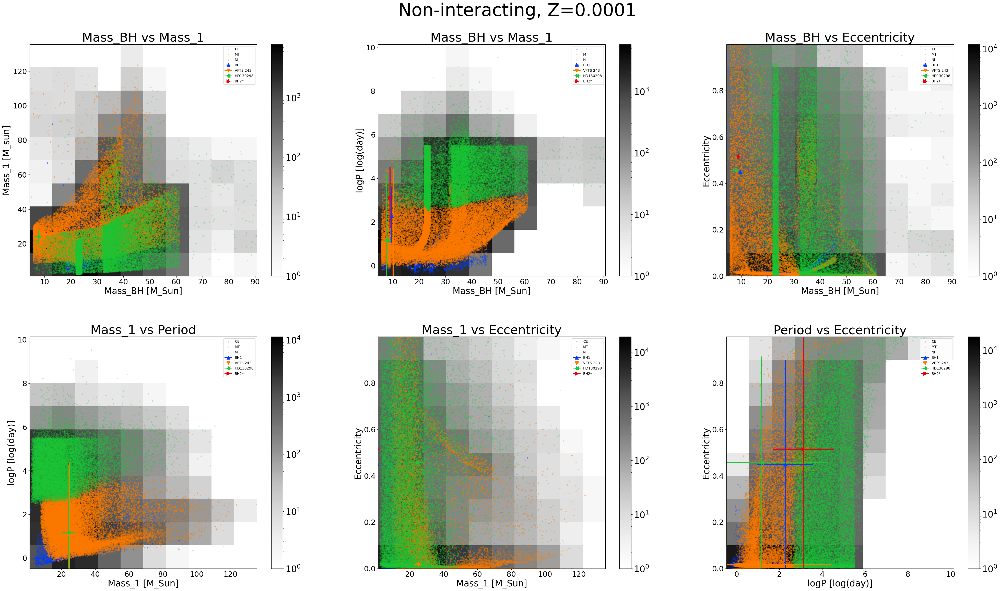

In [98]:
sn.set_palette('bright')
fig, ax = plt.subplots(2,3, figsize=(43,25))
fig.tight_layout(pad=15.0)

fig.suptitle('Non-interacting, Z=0.0001', fontsize=50)

for i in range(2):
    for j in range(3):
        ax[i,j].tick_params(labelsize=21)
        ax[i,j].xaxis.label.set_size(25)
        ax[i,j].yaxis.label.set_size(25)
        
marker = itertools.cycle(('^', 'v', '<', '>'))

groups = restr_data_nint.groupby('type')

plt.sca(ax[0,0])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Mass_1'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Mass_1'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dMass_1'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.Mass_1, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Mass_1 [M_sun]')
plt.title('Mass_BH vs Mass_1', fontsize=35)

plt.sca(ax[0,1])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.logP, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_BH vs Mass_1', fontsize=35)

plt.sca(ax[0,2])
plt.hist2d(restr_data_nint['Mass_BH'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[0,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.Mass_BH, group.Eccentricity, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('Mass_BH [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_BH vs Eccentricity', fontsize=35)

plt.sca(ax[1,0])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['logP'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,0]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.Mass_1, group.logP, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_1 vs Period', fontsize=35)

plt.sca(ax[1,1])
plt.hist2d(restr_data_nint['Mass_1'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,1]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_1'], real_data[real_data['name']==i]['Eccentricity'], xerr = real_data[real_data['name']==i]['dMass_1'], yerr = real_data[real_data['name']==i]['dEccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.Mass_1, group.Eccentricity, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('Mass_1 [M_Sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_1 vs Eccentricity', fontsize=35)

plt.sca(ax[1,2])
plt.hist2d(restr_data_nint['logP'], restr_data_nint['Eccentricity'], cmap='Greys', norm=matplotlib.colors.LogNorm())
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=25)
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:    
    color = next(ax[1,2]._get_lines.prop_cycler)['color']    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['logP'], real_data[real_data['name']==i]['Eccentricity'], xerr = abs(real_data[real_data['name']==i]['dlogP']), yerr = real_data[real_data['name']==i]['Eccentricity'], color=color, marker=next(marker), label=i, markersize=10, elinewidth=3)
    plt.legend(loc='best', fontsize=25)
for name, group in groups:
    plt.scatter(group.logP, group.Eccentricity, marker='.', alpha=0.2, label=name)
plt.legend()
plt.xlabel('logP [log(day)]')
plt.ylabel('Eccentricity')
plt.title('Period vs Eccentricity', fontsize=35)

plt.show()

fig.savefig('./images/non_int_type_Z0.0001.png')

## K-means clustering 

Works good with the interactive systems, because it's a smaller database. 
I should try using dask prior the clustering

```python
import dask_ml.cluster
import dask.dataframe as dd

# Load data into a Dask dataframe
df = dd.read_csv('path/to/data/*.csv')

# Subset the data to the relevant columns
cols = ['', '', '']
data = df[cols].values.compute()

# Initialize the k-means clustering model
kmeans = dask_ml.cluster.KMeans(n_clusters=n_best, init_max_iter=5)

# Fit the model to the data
with dask.config.set(scheduler='single-threaded'): #try to change to multi-threaded
    kmeans.fit(data)

# Predict the cluster labels for the data
labels = kmeans.predict(data)

# Store the cluster labels back to the Dask dataframe
df['labels'] = labels

# Write the labeled data to a CSV file
df.to_csv('labeled_data.csv', index=False)

```

In [6]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [84]:
%%time
# data to use
data = restr_data_int[['Mass_1', 'Eccentricity']]

# Use the silhouette score to determine the optimal number of clusters
max_clusters = 18
silhouette_scores = []
for n_clusters in range(2, max_clusters+1):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    labels = kmeans.fit_predict(data)
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)

# Choose the number of clusters with the highest silhouette score
optimal_clusters = np.argmax(silhouette_scores) + 2

# Perform clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, n_init=10)
data['cluster'] = kmeans.fit_predict(data)

# Get the centroids for each cluster
centroids = kmeans.cluster_centers_
cen_x = [i[0] for i in centroids]
cen_y = [i[1] for i in centroids]

# Add centroid coordinates to dataframe
data['cen_x'] = data.cluster.map({i: cen_x[i] for i in range(optimal_clusters)})
data['cen_y'] = data.cluster.map({i: cen_y[i] for i in range(optimal_clusters)})

# Get the indices of the top features for each cluster
feature_indices = []
for i in range(optimal_clusters):
    cluster_data = data[data['cluster'] == i]
    centroid = np.mean(cluster_data, axis=0)
    feature_indices.append(np.argsort(-centroid)[:3])

# Print the names of the top features for each cluster
for i, indices in enumerate(feature_indices):
    print(f"Cluster {i+1}: {data.columns[indices].tolist()}")

Cluster 1: ['Mass_1', 'cen_x', 'cen_y']
Cluster 2: ['Mass_1', 'cen_x', 'cluster']
Cluster 3: ['Mass_1', 'cen_x', 'cluster']
CPU times: total: 2min 11s
Wall time: 26.2 s


<timed exec>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


CPU times: total: 93.8 ms
Wall time: 123 ms


<timed exec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Mass_1 vs Ecc')

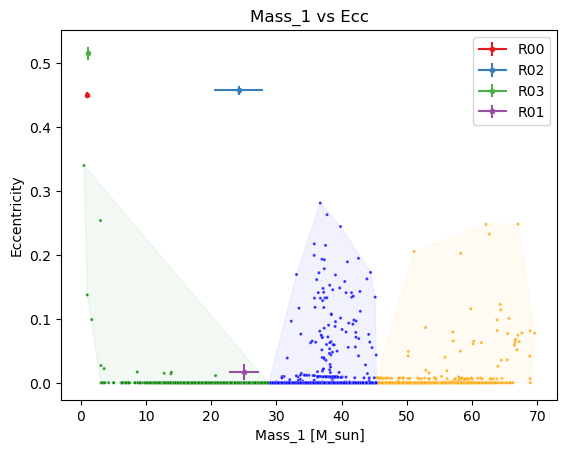

In [85]:
%%time
from scipy.spatial import ConvexHull
import itertools

# define and map colors
colors = ['orange', 'blue', 'green', 'red', 'purple', 'cyan', 'magenta', 'lime', 'pink', 'brown', 'gray', 'olive', 'teal', 'navy', 'maroon', 'gold', 'indigo', 'salmon'][:optimal_clusters]
data['c'] = data.cluster.map({i:colors[i] for i in range(optimal_clusters)})

marker = itertools.cycle(('x', '+', '*', '3')) #for the real data
# Plot the results
plt.clf()

# Draw the convex hull for each cluster
for i in data.cluster.unique():
    points = data[data.cluster == i][['Mass_1', 'Eccentricity']].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0],points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],points[hull.vertices,1][0])
    plt.fill(x_hull, y_hull, alpha=0.05, c=colors[i])

sn.scatterplot(data=data, x='Mass_1', y='Eccentricity', c=data.c, s=5, alpha=0.8)

ax = plt.gca()
sn.set_palette('Set1')
# Plot the real data
for i in ['R00','R02', 'R03','R01']:
    
    color = next(ax._get_lines.prop_cycler)['color']
    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['ID']==i]['Mass_1'], real_data[real_data['ID']==i]['Eccentricity'], xerr = real_data[real_data['ID']==i]['dMass_1'], yerr = real_data[real_data['ID']==i]['dEccentricity'], color=color, marker='.', label=i)
    plt.legend(loc='best')

plt.xlabel('Mass_1 [M_sun]')
plt.ylabel('Eccentricity')
plt.title('Mass_1 vs Ecc')

## K-means w/ Dask

In [8]:
#dd_data = dd.read_csv('./data/sevn_output_Z0.01A1L1/data_0/output_*.csv', )

non_int_binsys = non_int_binsys[['ID', 'name', 'Radius_0', 'Mass_0', 'Temperature_0', 'Luminosity_0', 'Radius_1', 'Mass_1', 'Temperature_1', 'Luminosity_1', 'Eccentricity', 'Period', 'logP', 'Semimajor']]

non_int_binsys = non_int_binsys.rename(columns={'Radius_0': 'Radius_BH', 'Mass_0': 'Mass_BH', 'Temperature_0': 'Temperature_BH', 'Luminosity_0': 'Luminosity_BH'})

non_int_binsys

,ID,name,Radius_BH,Mass_BH,Temperature_BH,Luminosity_BH,Radius_1,Mass_1,Temperature_1,Luminosity_1,Eccentricity,Period,logP,Semimajor
npartitions=60,,,,,,,,,,,,,,
,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...
,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [11]:
%%time
import dask_ml.cluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

data = non_int_binsys[['Mass_BH', 'logP']].compute()

# Initialize the k-means clustering model
# Use the silhouette score to determine the optimal number of clusters
max_clusters = 18
silhouette_scores = []
for n_clusters in range(2, max_clusters+1):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    with dask.config.set(scheduler='multi-threaded'):
        labels = kmeans.fit_predict(data)
        score = silhouette_score(data, labels)
        silhouette_scores.append(score)

# Choose the number of clusters with the highest silhouette score
optimal_clusters = np.argmax(silhouette_scores) + 2

# Perform clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, n_init=10)
with dask.config.set(scheduler='multi-threaded'):
    data['cluster'] = kmeans.fit_predict(data)

# Get the centroids for each cluster
with dask.config.set(scheduler='multi-threaded'):
    centroids = kmeans.cluster_centers_
    cen_x = [i[0] for i in centroids]
    cen_y = [i[1] for i in centroids]

# Add centroid coordinates to dataframe
data['cen_x'] = data.cluster.map({i: cen_x[i] for i in range(optimal_clusters)})
data['cen_y'] = data.cluster.map({i: cen_y[i] for i in range(optimal_clusters)})

# Get the indices of the top features for each cluster
feature_indices = []
for i in range(optimal_clusters):
    cluster_data = data[data['cluster'] == i]
    centroid = np.mean(cluster_data, axis=0)
    feature_indices.append(np.argsort(-centroid)[:3])

# Store the cluster labels back to the Dask dataframe


# Write the labeled data to a CSV file
data.to_csv('./labeled_data.csv', index=False)

ValueError: Expected one of [distributed, multiprocessing, processes, single-threaded, sync, synchronous, threading, threads]

In [10]:
for i, indices in enumerate(feature_indices):
    print(f"Cluster {i+1}: {data.columns[indices].tolist()}")

Cluster 1: ['Mass_BH', 'cen_x', 'logP']
Cluster 2: ['Mass_BH', 'cen_x', 'logP']
Cluster 3: ['cen_x', 'Mass_BH', 'logP']


In [26]:
data = dd.read_csv('./labeled_data.csv')
data.to_parquet('./labeled_data.parquet')

In [28]:
data = dd.read_parquet('./labeled_data.parquet')
data

,Mass_BH,logP,cluster,cen_x,cen_y
npartitions=1,,,,,
,float64,float64,int64,float64,float64
,...,...,...,...,...


C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\dask\array\core.py:1712: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\dask\array\core.py:1712: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\dask\array\core.py:1712: FutureWarning: The `numpy.column_stack` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(


CPU times: total: 1min 57s
Wall time: 1min 43s


Text(0.5, 1.0, 'Mass_BH vs Period')

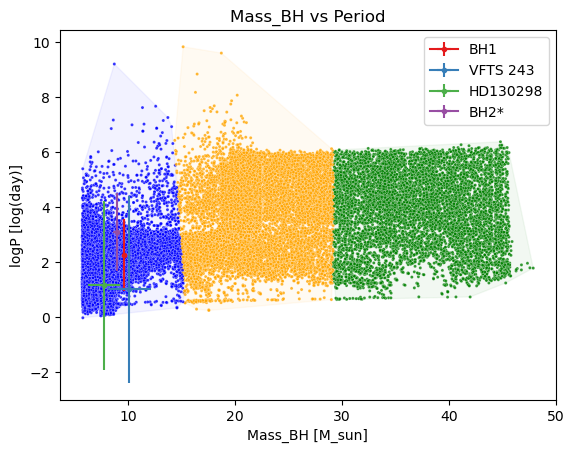

In [30]:
%%time

from scipy.spatial import ConvexHull
import itertools

# define and map colors
colors = ['orange', 'blue', 'green', 'red', 'purple', 'cyan', 'magenta', 'lime', 'pink', 'brown', 'gray', 'olive', 'teal', 'navy', 'maroon', 'gold', 'indigo', 'salmon'][:optimal_clusters]
data['c'] = data.cluster.map({i:colors[i] for i in range(optimal_clusters)})

marker = itertools.cycle(('x', '+', '*', '3')) #for the real data
# Plot the results
plt.clf()

# Draw the convex hull for each cluster
for i in data.cluster.unique():
    points = data[data.cluster == i][['Mass_BH', 'logP']].values
    hull = ConvexHull(points)
    x_hull = np.append(points[hull.vertices,0],points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],points[hull.vertices,1][0])
    plt.fill(x_hull, y_hull, alpha=0.05, c=colors[i])

sn.scatterplot(data=non_int_binsys, x='Mass_BH', y='logP', c=data.c, s=5, alpha=0.8)
#plt.yscale('log')

ax = plt.gca()
sn.set_palette('Set1')
# Plot the real data
for i in ['BH1', 'VFTS 243', 'HD130298', 'BH2*']:
    
    color = next(ax._get_lines.prop_cycler)['color']
    
    #plt.scatter(real_data[real_data['ID']==i]['Mass_BH'], real_data[real_data['ID']==i]['Period'], color=color, marker=next(marker), label=i, s=60)
    plt.errorbar(real_data[real_data['name']==i]['Mass_BH'], real_data[real_data['name']==i]['logP'], xerr = real_data[real_data['name']==i]['dMass_BH'], yerr = abs(real_data[real_data['name']==i]['dlogP']), color=color, marker='.', label=i)
    plt.legend(loc='best')

plt.xlabel('Mass_BH [M_sun]')
plt.ylabel('logP [log(day)]')
plt.title('Mass_BH vs Period')
#plt.ylim(-0.2e7, 1)

In [13]:
%%time

from dask_ml.cluster import KMeans
from sklearn.metrics import silhouette_score
import multiprocessing

data = non_int_binsys[['Mass_BH', 'logP']]

# Initialize the k-means clustering model
# Use the silhouette score to determine the optimal number of clusters
max_clusters = 18
silhouette_scores = []
for n_clusters in range(2, max_clusters+1):
    kmeans = KMeans(n_clusters=n_clusters, init_max_iter=10)
    kmeans.fit(data)
    labels = kmeans.predict(data)
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)

# Choose the number of clusters with the highest silhouette score
optimal_clusters = np.argmax(silhouette_scores) + 2

# Perform clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, init_max_iter=10)
kmeans.fit(data)
labels = kmeans.predict(data)
data['cluster'] = labels

# Get the centroids for each cluster
centroids = kmeans.cluster_centers_
cen_x = [i[0] for i in centroids]
cen_y = [i[1] for i in centroids]

# Add centroid coordinates to dataframe
data['cen_x'] = data.cluster.map({i: cen_x[i] for i in range(optimal_clusters)})
data['cen_y'] = data.cluster.map({i: cen_y[i] for i in range(optimal_clusters)})

# Get the indices of the top features for each cluster
feature_indices = []
for i in range(optimal_clusters):
    cluster_data = data[data['cluster'] == i]
    centroid = cluster_data.mean()
    feature_indices.append(centroid[cols].sort_values(ascending=False)[:3].index)

# Store the cluster labels back to the Dask DataFrame

# Write the labeled data to a CSV file
data.to_csv('./labeled_data.csv', index=False)

C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


KeyboardInterrupt: 

## UMAP (under testing)

In [190]:
import umap

C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [254]:
reducer = umap.UMAP(random_state=42)
 
reducer.fit(restr_data_int[['Mass_BH', 'Period']])

UMAP(random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [255]:
embedding = reducer.transform(restr_data_int[['Mass_BH', 'Period']])

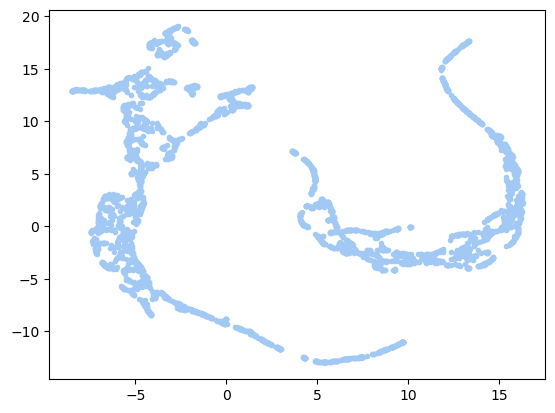

In [257]:
plt.scatter(embedding[:, 0], embedding[:, 1], marker='.')


In [266]:
clusterable_embedding = umap.UMAP(
    n_neighbors=100,
    min_dist=0.0,
    n_components=2,
    random_state=42
    
).fit_transform(restr_data_int[['Mass_BH', 'Period']])

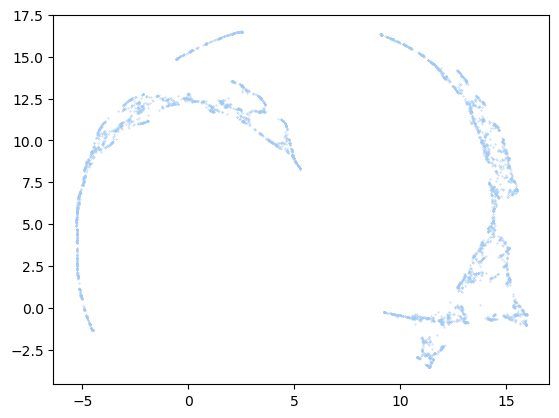

In [267]:
plt.scatter(clusterable_embedding[:, 0], clusterable_embedding[:, 1], s=0.1)

In [268]:
import hdbscan

labels = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500
).fit_predict(clusterable_embedding)


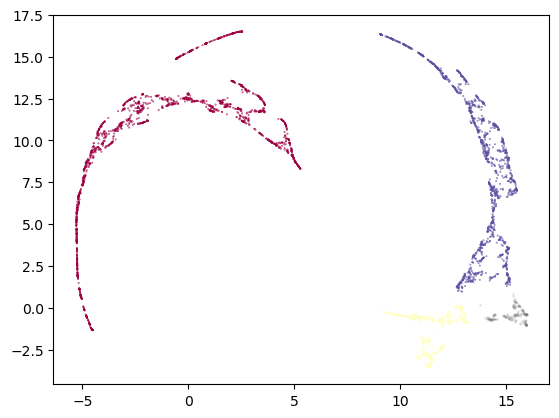

In [269]:
clustered = (labels >= 0)
plt.scatter(clusterable_embedding[~clustered, 0],
            clusterable_embedding[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(clusterable_embedding[clustered, 0],
            clusterable_embedding[clustered, 1],
            c=labels[clustered],
            s=0.1,
            cmap='Spectral');

In [272]:
labels

array([2, 0, 0, ..., 1, 1, 0])